# Exercício - Transmissão

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.axes_grid1 import make_axes_locatable

from IPython.display import display, display_html, HTML

from examples.seismic import Model, plot_velocity, TimeAxis, setup_geometry, RickerSource, AcquisitionGeometry
from devito import *

import gc
%matplotlib inline

## Parâmetros dos operadores de diferenças finitas

In [12]:
space_order=2

## Definição do modelo

### Dimensões do modelo

O modelo possui dimensões $w \times h = 1000 \mathrm{m} \times 1000 \mathrm{m}$, e um espaçamento de $\Delta x = \Delta z = 10$ m. Logo, a malha deverá ter 
$$
n_x = \frac{w}{\Delta x} + 1 = \frac{1000 \mathrm{m}}{10 \mathrm{m}} + 1 = 101
$$
pontos ao longo do eixo x, e
$$
n_z = \frac{h}{\Delta z} + 1 = \frac{1000 \mathrm{m}}{10 \mathrm{m}} + 1 = 101
$$
pontos ao longo do eixo z.

In [13]:
def create_model(vp1, vp2):
    shape = (101, 101)
    spacing = (10., 10.)
    origin = (0., 0.)
    # nbl=325
    nbl=200
    
    vp = vp1 * np.ones(shape, dtype=np.float32)
    vp[:, shape[1]//2:] = vp2

    return Model(vp=vp, origin=origin, shape=shape, spacing=spacing,
              space_order=space_order, nbl=nbl, bcs="damp")

### Parâmetros físicos

Os dois modelos utilizados possui os seguintes parâmetros

- Modelo 1:
    Camada|$v_P$ (km/s)
    ---|---
    1|1.5
    2|3.0

- Modelo 2:
    Camada|$v_P$ (km/s)
    ---|---
    1|3.0
    2|1.5

In [14]:
model1 = create_model(1.5, 3.0)
model2 = create_model(3.0, 1.5)

Operator `initdamp` ran in 0.01 s
Operator `Kernel` ran in 0.01 s
Operator `initdamp` ran in 0.01 s
Operator `Kernel` ran in 0.01 s


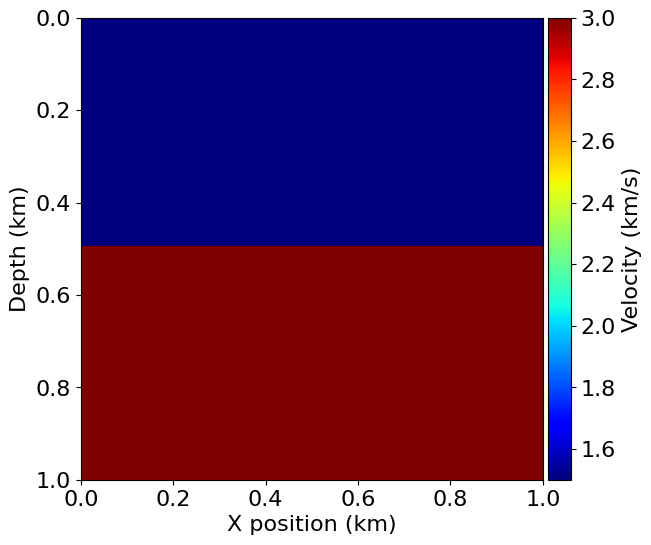

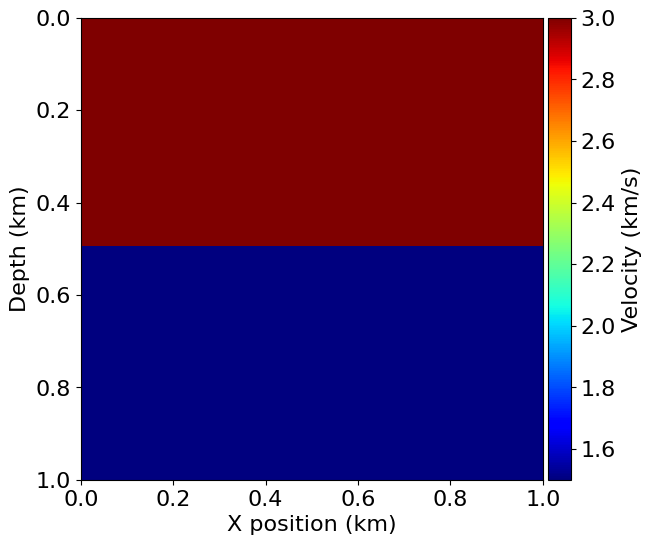

In [15]:
plot_velocity(model1)
plot_velocity(model2)

## Parâmetros da aquisição

### Tempo de aquisição

In [16]:
t0 = 0.  # ms
tn = 1000. # ms
dt = model1.critical_dt

time_range = TimeAxis(start=t0, stop=tn, step=dt)

### Geometria

Como o valor mínimo do campo de velocidade é $1.5\ \mathrm{km/s}$, o espaçamento do modelo é $\Delta x = \Delta z = 10 \mathrm{m}$ e a ordem do operador de diferenças finitas para as derivadas espaciais é igual a $2$ (F = 10), a frequência máxima $f_{\mathrm{max}}$ da onda propagada deve satisfazer
$$
\begin{aligned}
f_{\mathrm{max}} &\le \frac{\min{v_P}}{F\max{\Delta x, \Delta z}}\\
    &= \frac{1.5\ \mathrm{km/s}}{10 \times 10\ \mathrm{m}}\\
    &= 0.015\ \mathrm{kHz}
\end{aligned}
$$
A assinatura da fonte será a fonte de Ricker, que possui uma frequência de pico $f_{\mathrm{peak}} \approx = \dfrac{1}{3} f_{\mathrm{max}}$. Com base nisto, foi escolhida uma frequência máxima de $0.015\ \mathrm{kHz}$, resultando numa frequência de pico igual a $0.005\ \mathrm{kHz}$.

In [17]:
# Frequência de pico da fonte
f0 = 0.005

In [18]:
geometry = AcquisitionGeometry(model1, np.array([[0,0]], dtype=model1.dtype), np.array([[0,0]], dtype=model1.dtype), t0, tn)
# geometry.resample(dt)

In [19]:
src = RickerSource(name='src', grid=model1.grid, f0=f0,
                   npoint=1, time_range=time_range)

src.coordinates.data[0, 0] = model1.domain_size[0] * .5
src.coordinates.data[0, 1] = model1.domain_size[1]*(1/2 - 3**.5 * 1/12)

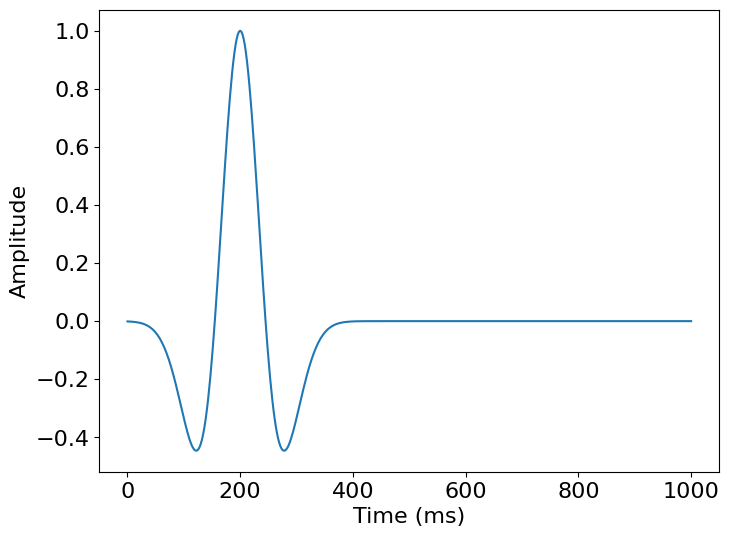

In [20]:
src.show()

#### Posição da fonte

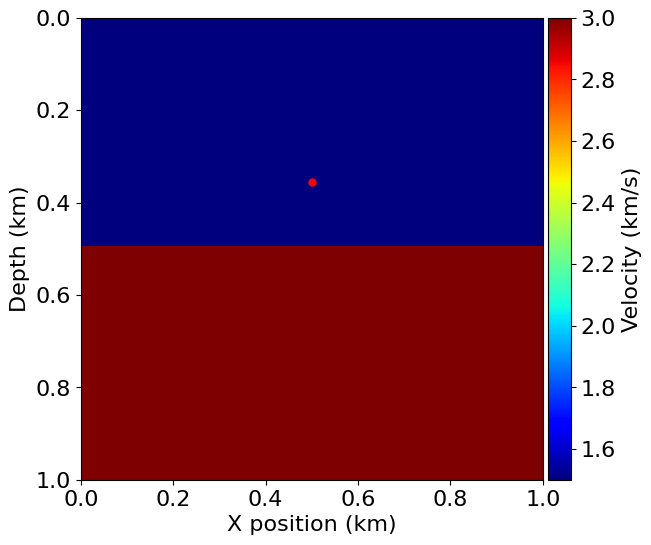

In [21]:
plot_velocity(model1, source=src.coordinates.data)

### Cálculo do campo de ondas

In [22]:
# Função pra o campo de pressão
P1 = TimeFunction(name="P1", grid=model1.grid, time_order=2, space_order=space_order, save=geometry.nt, staggered=NODE)
P2 = TimeFunction(name="P2", grid=model1.grid, time_order=2, space_order=space_order, save=geometry.nt, staggered=NODE)

In [23]:
vp = model1.vp

In [24]:
# Equação da onda acústica de 2ª ordem
EDP = 1/vp**2 * P1.dt2 - P1.laplace
EDP

-Derivative(P1(time, x, y), (x, 2)) - Derivative(P1(time, x, y), (y, 2)) + Derivative(P1(time, x, y), (time, 2))/vp(x, y)**2

In [25]:
# Expressão para o campo de ondas futuro, P(r, t + dt)
stencil = Eq(P1.forward, solve(EDP, P1.forward))
stencil

Eq(P1(time + dt, x, y), dt**2*(-(-2.0*P1(time, x, y)/dt**2 + P1(time - dt, x, y)/dt**2)/vp(x, y)**2 + Derivative(P1(time, x, y), (x, 2)) + Derivative(P1(time, x, y), (y, 2)))*vp(x, y)**2)

In [26]:
# Símbolo do espaçamento temporal
s = model1.grid.stepping_dim.spacing

# Expressão do termo fonte a ser injetada no stencil criado acima
src_term = src.inject(field=P1.forward, expr=src * s**2 * vp**2)

In [27]:
# Criação do operador do Devito
op = Operator([stencil] + src_term, subs=model1.spacing_map)

In [31]:
# Execução
op(dt=dt, P1=P1, vp=model1.vp)
op(dt=dt, P1=P2, vp=model2.vp)

Operator `Kernel` ran in 0.11 s
Operator `Kernel` ran in 0.14 s


PerformanceSummary([(PerfKey(name='section0', rank=None),
                     PerfEntry(time=0.13275200000000006, gflopss=0.0, gpointss=0.0, oi=0.0, ops=0, itershapes=[])),
                    (PerfKey(name='section1', rank=None),
                     PerfEntry(time=0.00016199999999999974, gflopss=0.0, gpointss=0.0, oi=0.0, ops=0, itershapes=[]))])

### Plotagem do campo de ondas

In [33]:
def plot_wavefield(u, geometry, src_pos, model, title=None, reverse_time=False, t0=0, tn=-1, rec_pos=None):
    shape_pad = np.array(model.shape) + 2 * model.nbl
    origin_pad = tuple([o - s*model.nbl for o, s in zip(model.origin, model.spacing)])
    extent_pad = tuple([s*(n-1) for s, n in zip(model.spacing, shape_pad)])

    # Note: flip direction of second dimension to make the plot positive downwards
    plt_extent = [origin_pad[0], origin_pad[0] + extent_pad[0],
                origin_pad[1] + extent_pad[1], origin_pad[1]]
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 4), sharex=True)
    fig.suptitle(title, size=20, y=1.05)
    isfirst = True
    last_ax = None
    last_plot = None

    t0 = t0 - geometry.t0
    tn = tn - geometry.t0

    snapshots = None
    if tn < 0:
        idx_min = max(int(np.round(t0/dt)), 0)
        snapshots = np.linspace(idx_min, geometry.nt - 1, num=4, dtype=np.int32)
    else:
        idx_min = max(int(np.round(t0/dt)), 0)
        idx_max = min(int(np.round(tn/dt)), geometry.nt - 1)
        snapshots = np.linspace(idx_min, idx_max, num=4, dtype=np.int32)


    udata = u.data

    amax = np.max(np.abs(udata[geometry.nt-1, :, :]))
    if reverse_time:
        snapshots = np.flip(snapshots)
        amax = np.max(np.abs(udata[0, :, :]))


    for count, ax in enumerate(axes.ravel()):
        snapshot = snapshots[count]
        last_plot = ax.imshow(udata[snapshot,:,:].T,
                              cmap="seismic", vmin=-amax,
                  vmax=+amax, extent=plt_extent)
        ax.plot(src_pos[0], src_pos[1], 'red', linestyle='None', marker='*',
                markersize=8, label="Source")
        
        if type(rec_pos) != type(None):
            ax.plot(rec_pos[0], rec_pos[1], 'green', linestyle='None', marker='v',
                    markersize=8, label="Receiver")
            
        nbl_color = 'xkcd:dark blue'
        ax.plot([model.origin[0], model.domain_size[0]], [model.origin[1], model.origin[1]], ls='dashed', color=nbl_color)
        ax.plot([model.domain_size[0], model.domain_size[0]], [model.origin[1], model.domain_size[1]], ls='dashed', color=nbl_color)
        ax.plot([model.origin[0], model.domain_size[0]], [model.domain_size[1], model.domain_size[1]], ls='dashed', color=nbl_color)
        ax.plot([model.origin[0], model.origin[0]], [model.origin[1], model.domain_size[1]], ls='dashed', color=nbl_color)
        ax.plot([-model.nbl * model.spacing[0], model.domain_size[0] + model.nbl*model.spacing[0]], 
                [model.domain_size[1]//2, model.domain_size[1]//2], ls='dashed', color='orange')
        # ax.text(0, 0, 'nbl', color=nbl_color)

        ax.grid()
        ax.tick_params('both', length=4, width=0.5, which='major', labelsize=11)

        ax.set_title("t=%.2fms" % (snapshot*dt + geometry.t0), fontsize=12)
        ax.set_xlabel("x (m)", fontsize=12)
        isfirst and ax.set_ylabel("z (m)", fontsize=12)
        isfirst = False
        last_ax = ax
    
    divider = make_axes_locatable(last_ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(last_plot, cax=cax)

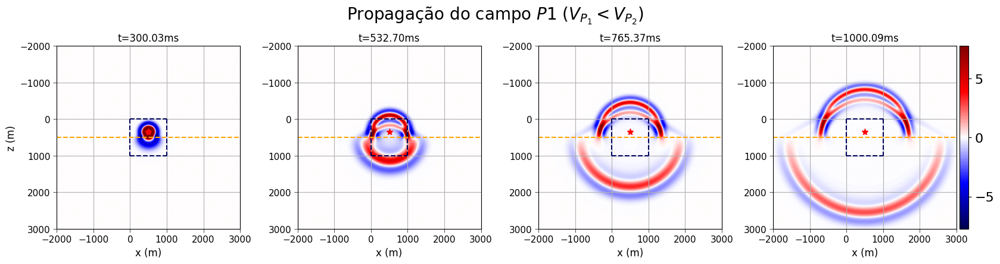

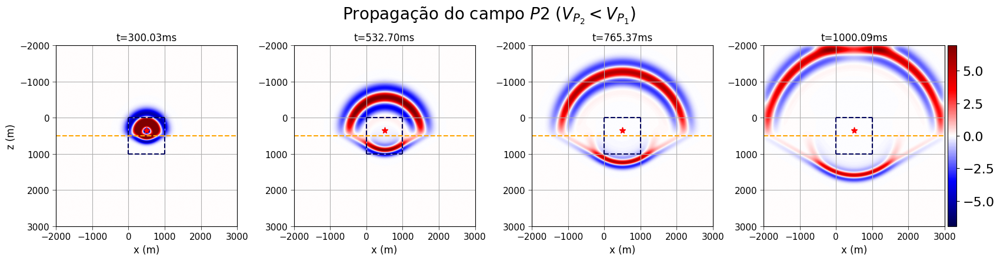

In [35]:
plot_wavefield(P1, geometry, src.coordinates.data[0], model1, 'Propagação do campo $P1$ ($V_{P_1} < V_{P_2}$)', t0=300, tn=1600)
plot_wavefield(P2, geometry, src.coordinates.data[0], model2, 'Propagação do campo $P2$ ($V_{P_2} < V_{P_1}$)', t0=300, tn=1600)

In [37]:
def plot_animated_wavefield(u, geometry, src_pos, model, title=None, reverse_time=False, t0=0, tn=-1, rec_pos=None, nframes=10):
    shape_pad = np.array(model.shape) + 2 * model.nbl
    origin_pad = tuple([o - s*model.nbl for o, s in zip(model.origin, model.spacing)])
    extent_pad = tuple([s*(n-1) for s, n in zip(model.spacing, shape_pad)])

    # Note: flip direction of second dimension to make the plot positive downwards
    plt_extent = [origin_pad[0], origin_pad[0] + extent_pad[0],
                origin_pad[1] + extent_pad[1], origin_pad[1]]
    
    fig, ax = plt.subplots(1, 1, figsize=(8, 5), sharex=True)

    t0 = t0 - geometry.t0
    tn = tn - geometry.t0

    snapshots = None
    if tn < 0:
        idx_min = max(int(np.round(t0/dt)), 0)
        snapshots = np.linspace(idx_min, geometry.nt - 1, num=nframes, dtype=np.int32)
    else:
        idx_min = max(int(np.round(t0/dt)), 0)
        idx_max = min(int(np.round(tn/dt)), geometry.nt - 1)
        snapshots = np.linspace(idx_min, idx_max, num=nframes, dtype=np.int32)


    udata = u.data

    amax = np.max(np.abs(udata[geometry.nt-1, :, :]))
    if reverse_time:
        snapshots = np.flip(snapshots)
        amax = np.max(np.abs(udata[0, :, :]))
    
    snapshot = snapshots[0]
    wave_plot = ax.imshow(udata[snapshot,:,:].T,
                            cmap="seismic", vmin=-amax,
                vmax=+amax, extent=plt_extent)
    ax.plot(src_pos[0], src_pos[1], 'red', linestyle='None', marker='*',
            markersize=8, label="Source")
    
    if type(rec_pos) != type(None):
        ax.plot(rec_pos[0], rec_pos[1], 'green', linestyle='None', marker='v',
                markersize=8, label="Receiver")
        
    nbl_color = 'xkcd:dark blue'
    ax.plot([model.origin[0], model.domain_size[0]], [model.origin[1], model.origin[1]], ls='dashed', color=nbl_color)
    ax.plot([model.domain_size[0], model.domain_size[0]], [model.origin[1], model.domain_size[1]], ls='dashed', color=nbl_color)
    ax.plot([model.origin[0], model.domain_size[0]], [model.domain_size[1], model.domain_size[1]], ls='dashed', color=nbl_color)
    ax.plot([model.origin[0], model.origin[0]], [model.origin[1], model.domain_size[1]], ls='dashed', color=nbl_color)
    ax.plot([-model.nbl * model.spacing[0], model.domain_size[0] + model.nbl*model.spacing[0]], 
                [model.domain_size[1]//2, model.domain_size[1]//2], ls='dashed', color='orange')
    time_text = ax.text(
        plt_extent[0] + (plt_extent[2] - plt_extent[0])*0.05, 
        plt_extent[1] + (plt_extent[3] - plt_extent[1])*0.05
    , 't=...', color=nbl_color)
    ax.set_title(title)

    ax.grid()
    ax.tick_params('both', length=4, width=0.5, which='major', labelsize=11)

    ax.set_xlabel("x (m)", fontsize=12)
    ax.set_ylabel("z (m)", fontsize=12)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(wave_plot, cax=cax)

    def update(snapshot):
        wave_plot.set_array(udata[snapshot,:,:].T)
        time = snapshot*dt + geometry.t0
        time_text.set_text("t=%.2fms" % time)
                


    anim = animation.FuncAnimation(fig, update, frames=snapshots, blit=False)

    plt.close(fig)
    display(HTML(anim.to_jshtml()))

In [38]:
plot_animated_wavefield(P1, geometry, src.coordinates.data[0], model1, 'Propagação do campo $P1$ ($V_{P_1} < V_{P_2}$)', nframes=40)
plot_animated_wavefield(P2, geometry, src.coordinates.data[0], model2, 'Propagação do campo $P2$ ($V_{P_2} < V_{P_1}$)', nframes=40)